In [1]:
import pathlib
from functools import partial

from astropy.convolution import convolve, Gaussian2DKernel
from astropy.constants import G
import astropy.table as at
import astropy.units as u
import cmasher as cmr
import gala.integrate as gi
import gala.dynamics as gd
import jax
import matplotlib as mpl
import matplotlib.pyplot as plt
from pyia import GaiaData
from tqdm import tqdm, trange

%matplotlib inline
import numpy as np
from gala.units import galactic
from scipy.interpolate import InterpolatedUnivariateSpline

jax.config.update("jax_enable_x64", True)
import jax.numpy as jnp
import torusimaging as oti
from config import galcen_frame
from config import plot_data_model_residual
from model_maker import SplineLabelModelWrapper

import agama

agama.setUnits(mass=u.Msun, length=u.kpc, time=u.Myr)

In [2]:
tbl = at.Table.read(
    "../../gaia-actions/cache/allStar-dr17-synspec_rev1-GaiaDR3-EDR3_STARHORSE_v2-MilkyWayPotential2022-staeckel.fits"
)
len(tbl)

554738

In [3]:
dr17 = at.Table.read(
    "/mnt/home/apricewhelan/data/APOGEE/DR17/allStarLite-dr17-synspec_rev1.fits"
)
gaia = at.Table.read(
    "/mnt/home/apricewhelan/data/APOGEE/DR17/allStar-dr17-synspec-gaiadr3-gaiasourcelite.fits"
)

In [4]:
joined = at.join(tbl, dr17, keys="APOGEE_ID")
joined = at.join(joined, gaia, keys="APOGEE_ID")
joined = at.unique(joined, keys="APOGEE_ID")

In [5]:
len(joined)

554738

In [6]:
all_g = GaiaData(joined)

In [10]:
g = all_g.filter(
    LOGG=(1.5, 3),
    TEFF=(3000, 5500),
    FE_H=(-0.8, 0.5),
    MG_FE=(-0.2, 0.22),
    parallax=(0.0 * u.mas, None),
)

mask_bits = {
    "ASPCAPFLAG": [7, 23],  # STAR_WARN, STAR_BAD
    "STARFLAG": [9, 18, 16, 17, 23],  # PERSIST_HIGH, BAD_RV_COMBINATION, etc.
    # Remove stars targeted in known clusters or dwarf galaxies:
    "APOGEE_TARGET1": [9, 18, 24, 26],
    "APOGEE_TARGET2": [10, 18],
    "APOGEE2_TARGET1": [9, 18, 20, 21, 22, 23, 24, 26],
    "APOGEE2_TARGET2": [10],
    "APOGEE2_TARGET3": [5, 14, 15],
    "MEMBERFLAG": 0,
}

target_mask = np.ones(len(g), dtype=bool)
for name, bits in mask_bits.items():
    if isinstance(bits, (list, np.ndarray)):
        target_mask &= (g[name] & np.sum(2 ** np.array(bits))) == 0
    else:
        target_mask &= g[name] == bits
print(len(target_mask), target_mask.sum())

g = g[target_mask]
len(g)

162443 136799


136799

In [12]:
c = g.get_skycoord(radial_velocity=g.VHELIO_AVG * u.km / u.s)
galcen = c.transform_to(galcen_frame)
w = gd.PhaseSpacePosition(galcen.data)

Set maximum $z, v_z$ for binning based on solar radius bin:

In [24]:
Rg_l, Rg_r = (7.0, 9.0)

Rg_mask = (g.R_guide > Rg_l) & (g.R_guide <= Rg_r)

oti_data = oti.OTIData(
    pos=w.z[Rg_mask],
    vel=w.v_z[Rg_mask],
    labels=dict(mgfe=g.MG_FE[Rg_mask]),
    label_errs=dict(mgfe=g.MG_FE_ERR[Rg_mask]),
)

max_z = 2 * np.nanpercentile(np.abs(oti_data.pos), 90)
max_vz = 2 * np.nanpercentile(np.abs(oti_data.vel), 90).to(u.km / u.s)
max_z, max_vz

(<Quantity 2.24264388 kpc>, <Quantity 73.34837433 km / s>)

In [25]:
zbins = np.linspace(-1, 1, 101) * max_z
vzbins = np.linspace(-1, 1, 101) * max_vz
zvz_bins = {"pos": zbins, "vel": vzbins}

/tmp/ipykernel_913445/3686986237.py:24: RuntimeWarning: invalid value encountered in multiply
  std_im = bdata['mgfe_err'] * np.sqrt(cdata['counts'])


6.0 True 1300
6.25 True 1695
6.5 True 1251
6.75 True 2008
7.0 True 1307
7.25 True 1341
7.5 True 1237
7.75 True 1616
8.0 True 1779
8.25 True 1518
8.5 True 1998
8.75 True 1643
9.0 True 1460
9.25 True 1868
9.5 True 1444
9.75 True 1874
10.0 True 2085
10.25 True 911
10.5 True 1570
10.75 True 1513


/tmp/ipykernel_913445/3686986237.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1, 3, figsize=(17, 5), constrained_layout=True)


11.0 True 1652
11.25 True 1727
11.5 True 2315
11.75 True 1812
12.0 True 1939


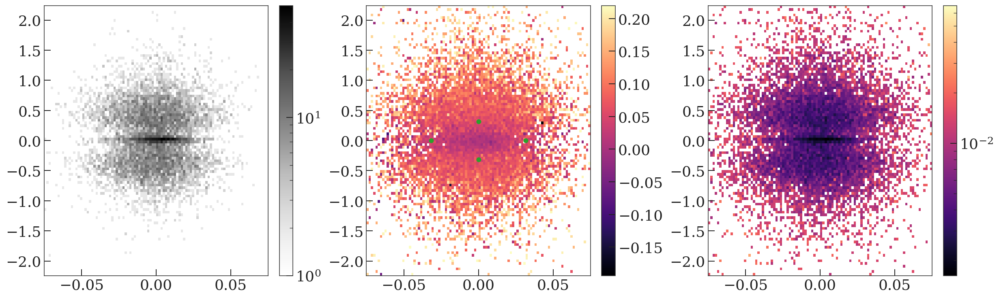

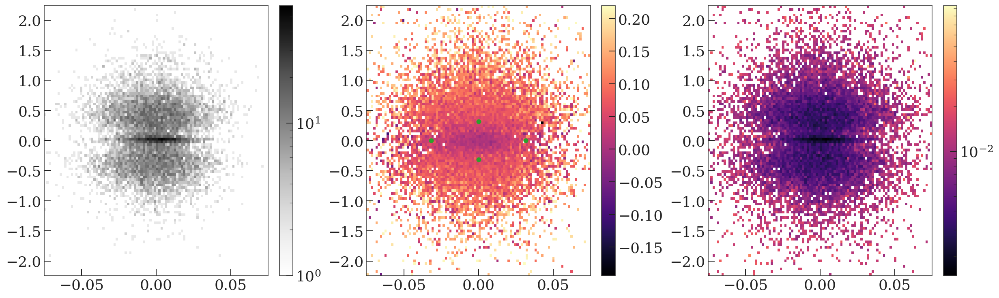

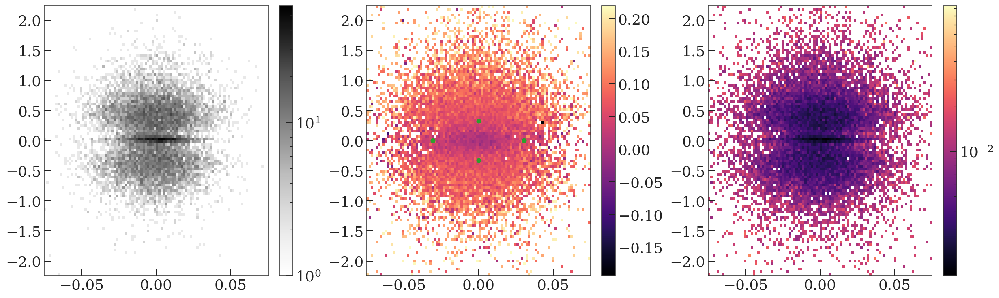

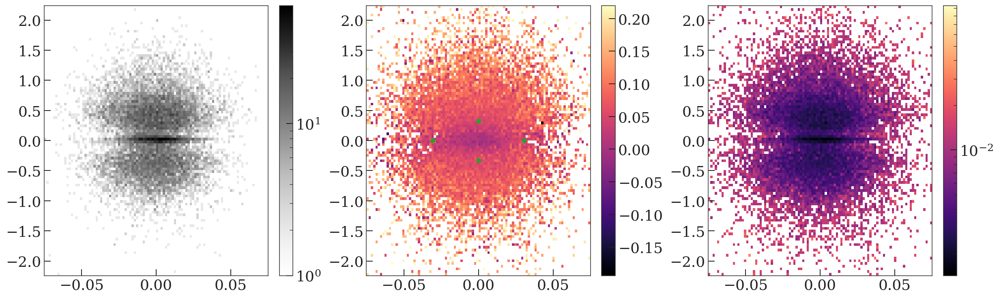

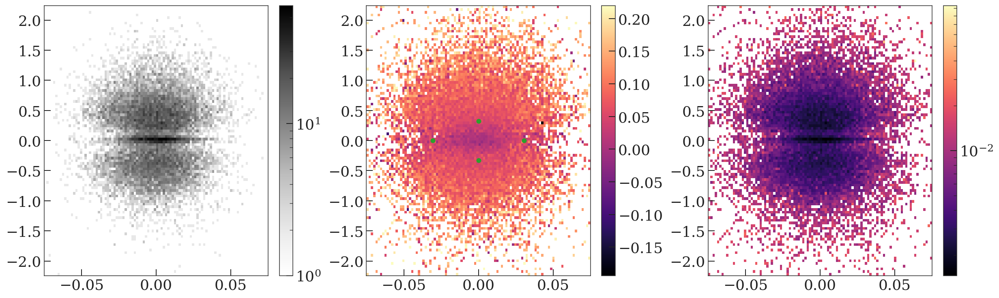

...

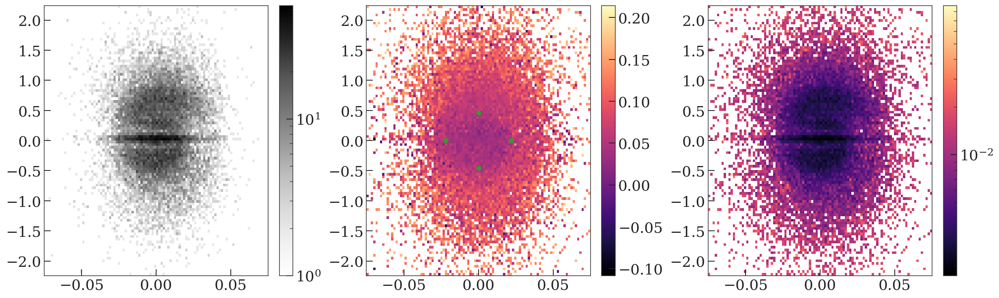

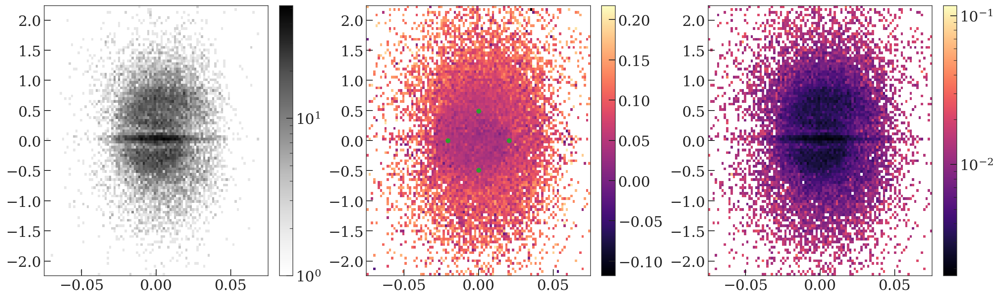

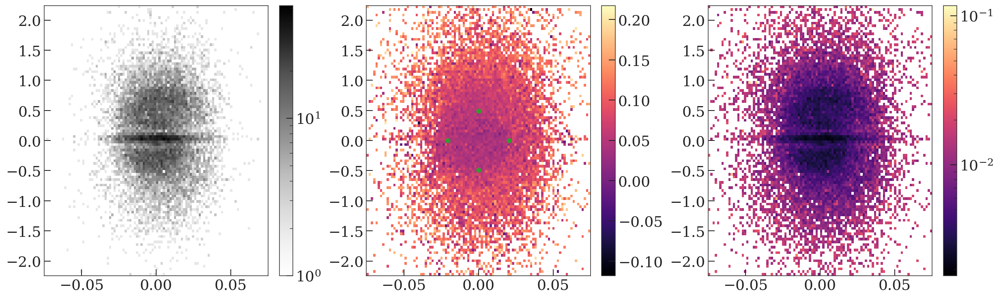

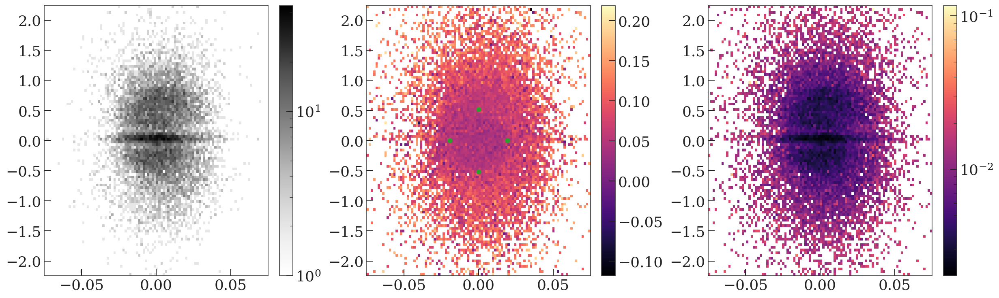

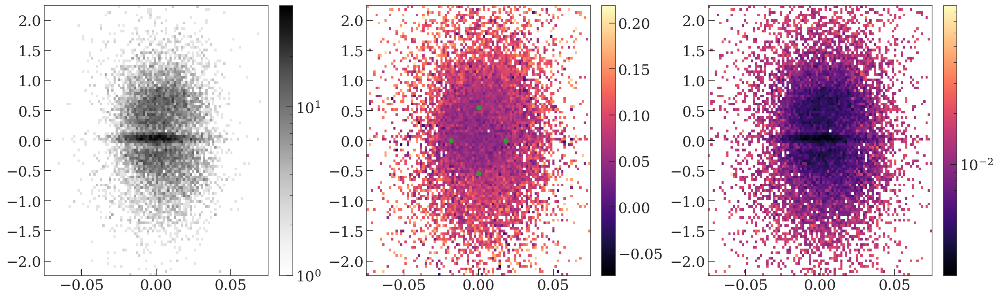

In [80]:
Rg_w = 2.0
Rg_cs = np.arange(6, 12 + 1e-3, 0.25)

oti_datas = []
bdatas = []
reses = []

for Rg_c in Rg_cs:
    Rg_l, Rg_r = (Rg_c - Rg_w / 2, Rg_c + Rg_w / 2)

    Rg_mask = (g.R_guide > Rg_l) & (g.R_guide <= Rg_r)
    oti_data = oti.OTIData(
        pos=w.z[Rg_mask],
        vel=w.v_z[Rg_mask],
        labels=dict(mgfe=g.MG_FE[Rg_mask]),
        label_errs=dict(mgfe=g.MG_FE_ERR[Rg_mask]),
    )
    oti_datas.append(oti_data)

    cdata = oti_data.get_binned_counts(zvz_bins)
    bdata, _ = oti_data.get_binned_label(bins=zvz_bins)
    bdatas.append(bdata)

    std_im = bdata["mgfe_err"] * np.sqrt(cdata["counts"])
    std_im[cdata["counts"] < 10] = np.nan

    ell_mask = np.abs(
        bdata["mgfe"] - np.nanpercentile(oti_data.labels["mgfe"], 15)
    ) < 3 * np.nanmean(std_im)
    tmpv = bdata["vel"][ell_mask]
    tmpz = bdata["pos"][ell_mask]
    init_Omega = MAD(tmpv) / MAD(tmpz) * u.rad

    # ---

    fig, axes = plt.subplots(1, 3, figsize=(17, 5), constrained_layout=True)
    cs = axes[0].pcolormesh(
        bdata["vel"].value,
        bdata["pos"].value,
        cdata["counts"],
        norm=mpl.colors.LogNorm(),
        cmap="Greys",
    )
    fig.colorbar(cs, ax=axes[0])

    cs = axes[1].pcolormesh(
        bdata["vel"].value,
        bdata["pos"].value,
        bdata["mgfe"],
    )
    fig.colorbar(cs, ax=axes[1])

    for ss in [1, -1]:
        axes[1].scatter(ss * 0.1 * np.sqrt(init_Omega.value), 0.0, color="tab:green")
        axes[1].scatter(0.0, ss * 0.1 / np.sqrt(init_Omega.value), color="tab:green")

    cs = axes[2].pcolormesh(
        bdata["vel"].value,
        bdata["pos"].value,
        bdata["mgfe_err"],
        norm=mpl.colors.LogNorm(),
    )
    fig.colorbar(cs, ax=axes[2])

    max_re = np.mean(
        [
            (max_z * np.sqrt(init_Omega)).decompose(galactic).value,
            (max_vz / np.sqrt(init_Omega)).decompose(galactic).value,
        ]
    )

    model = SplineLabelModelWrapper(
        r_e_max=max_re,
        label_n_knots=9,
        label0_bounds=(-1.0, 1.0),
        label_grad_sign=1.0,
        label_regularize_sigma=1.0,
        label_smooth_sigma=0.2,
        e_n_knots={2: 8, 4: 4},
        e_knots_scale={2: (lambda x: x ** (3 / 2), lambda x: x ** (2 / 3))},
        e_regularize_sigmas={2: 0.1, 4: 0.1},
        e_smooth_sigmas={2: 0.2, 4: 0.2},
    )

    p0 = model.get_init_params(oti_data)
    p0["e_params"][2]["vals"] = np.full_like(
        p0["e_params"][2]["vals"], np.log(0.2 / max_re)
    )

    bdata, res = model.run(
        bdata,
        p0=p0,
        label_name="mgfe",
        bins=zvz_bins,
        jaxopt_kw=dict(maxiter=32768, tol=1e-10),
    )
    print(Rg_c, res.state.success, res.state.iter_num)
    reses.append(res)

/mnt/ceph/users/apricewhelan/projects/torusimaging-paper2/scripts/config.py:61: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(


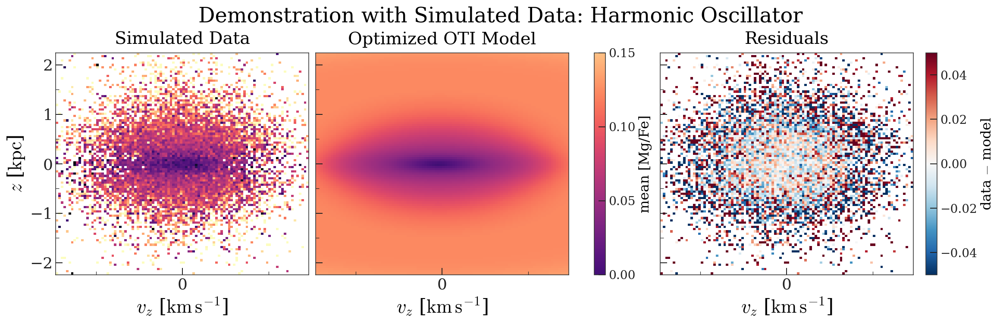

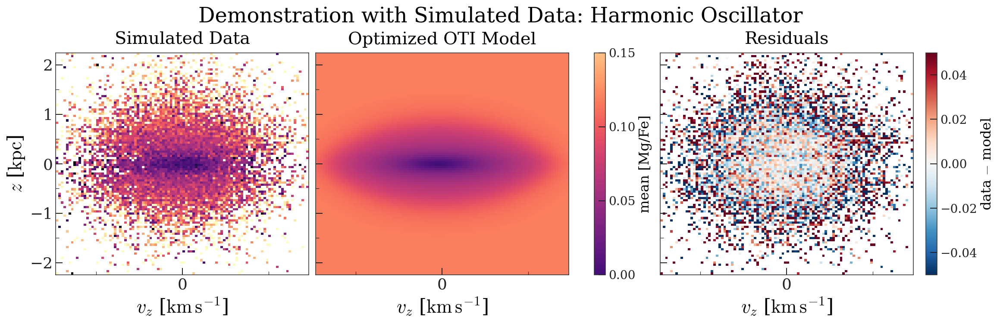

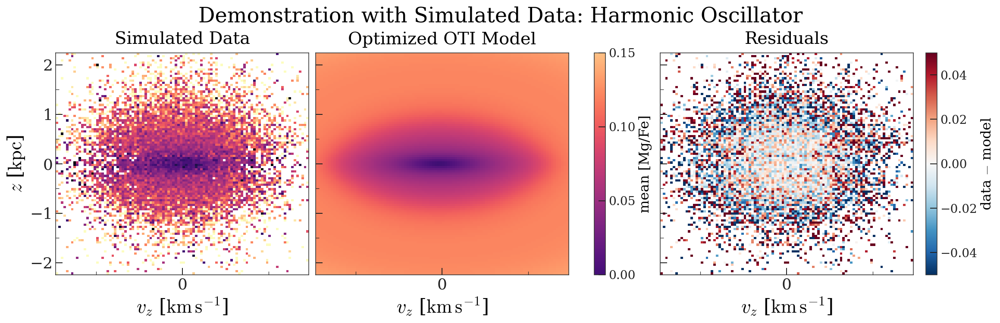

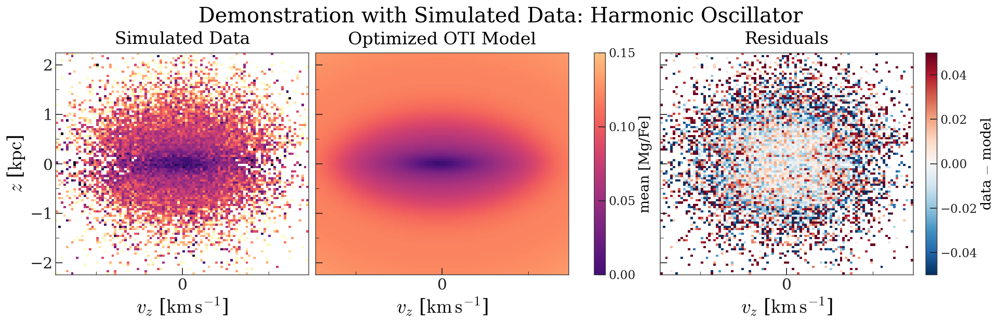

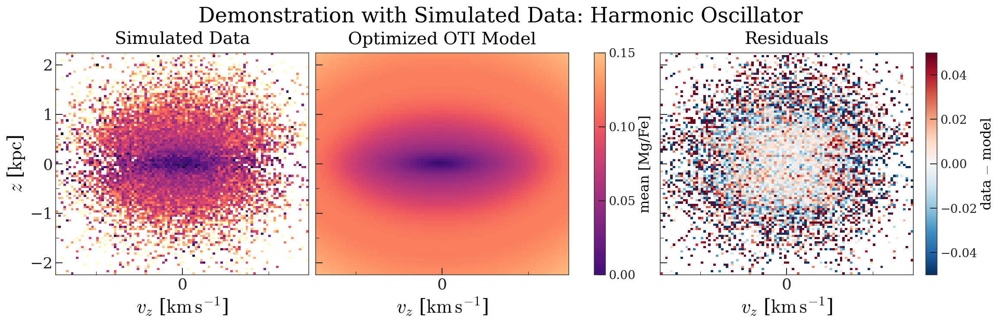

...

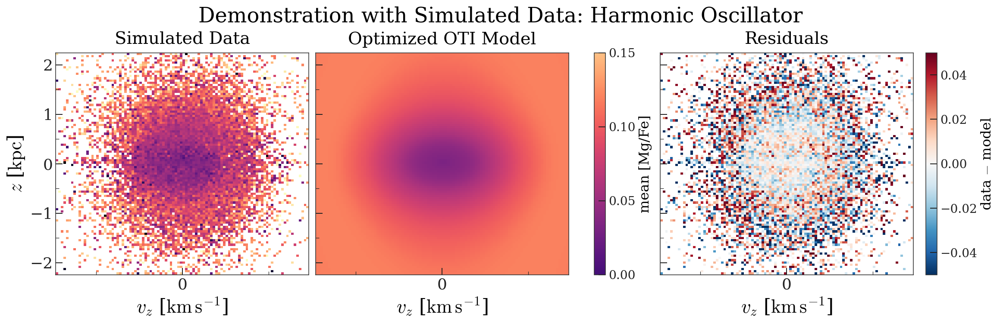

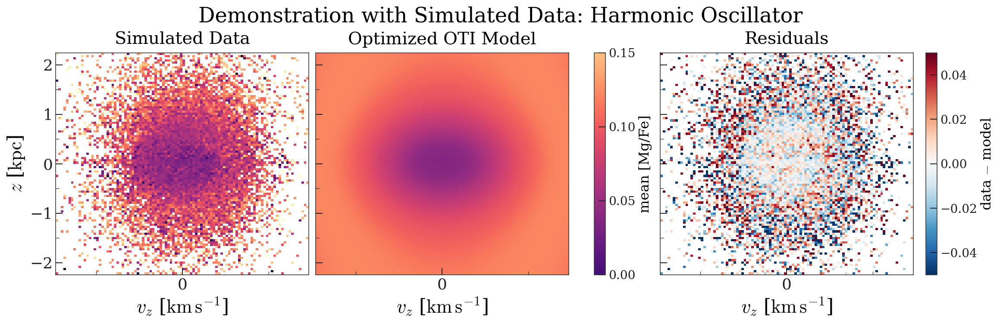

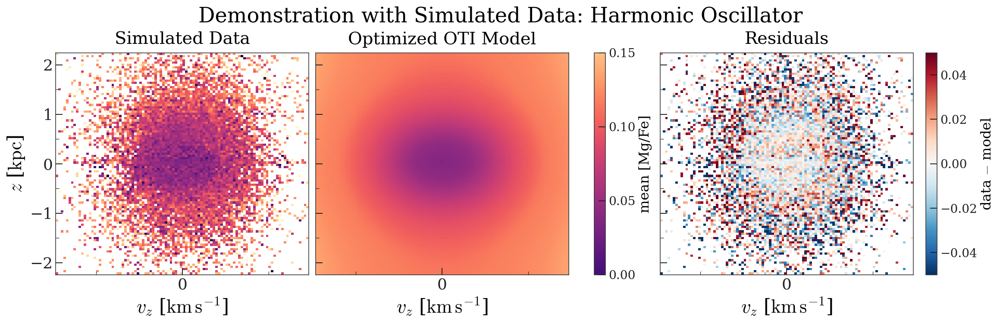

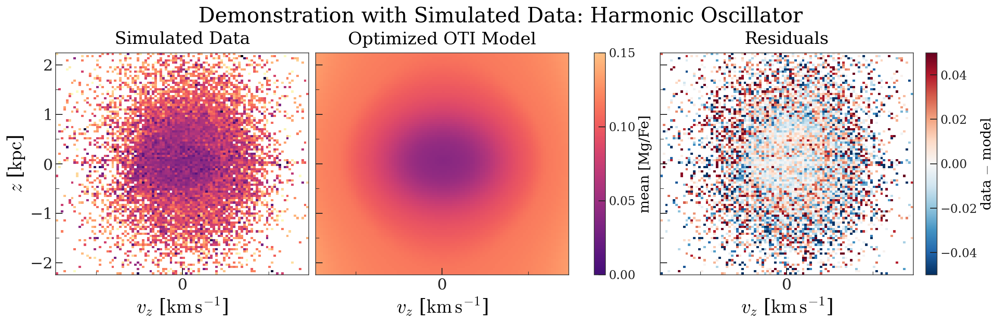

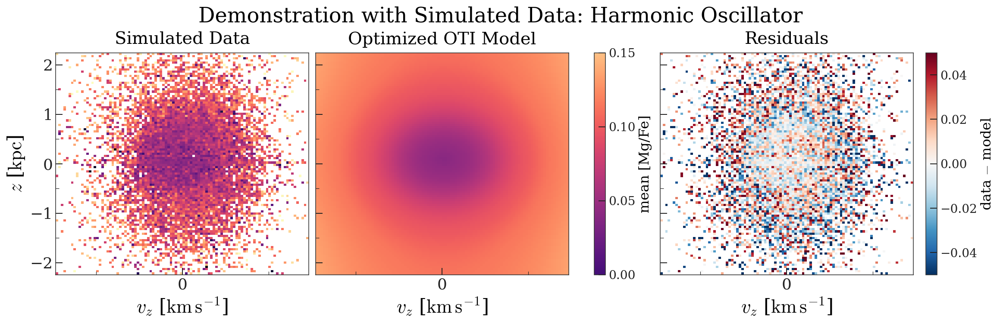

In [81]:
for res, bdata in zip(reses, bdatas):
    fig, axes = plot_data_model_residual(
        model, bdata, res.params, zlim=max_z, vzlim=max_vz, aspect=False
    )

In [82]:
pcls = []
for bdata, res in zip(bdatas, reses):
    tmp_data = bdata.copy()
    tmp_data["label"] = tmp_data.pop("mgfe")
    tmp_data["label_err"] = tmp_data.pop("mgfe_err")
    tmp_mask = np.logical_and.reduce([np.isfinite(tmp_data[k]) for k in tmp_data])
    tmp_data = {k: tmp_data[k][tmp_mask] for k in tmp_data}

    errs = model.label_model.error_propagate_uncertainty(res.params, tmp_data)

    Omega0_samples = (
        np.exp(
            np.random.normal(res.params["ln_Omega0"], errs["ln_Omega0"][0], size=10000)
        )
        / u.Myr
    )
    rho0_samples = (Omega0_samples**2 / (4 * np.pi * G)).to_value(u.Msun / u.pc**3)

    pcls.append(np.nanpercentile(rho0_samples, [5, 16, 50, 84, 95]))

pcls = np.array(pcls)

Text(0, 0.5, '$\\rho(z=0)$')

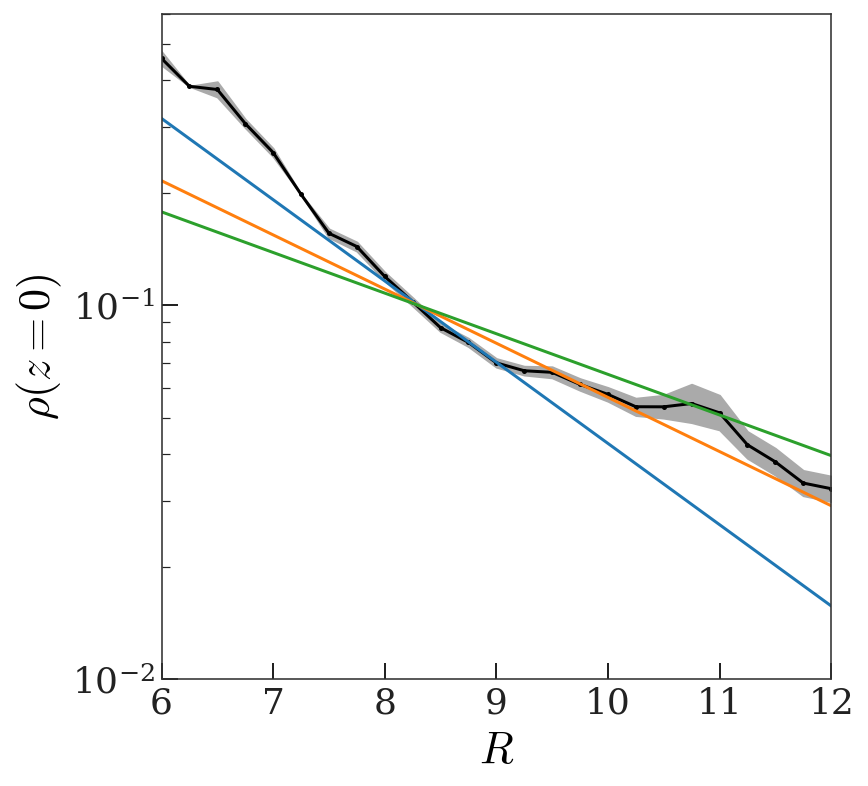

In [88]:
plt.plot(Rg_cs, pcls[:, 2])
plt.fill_between(Rg_cs, pcls[:, 0], pcls[:, -1], zorder=-10, color="#aaaaaa")

grid = np.linspace(6, 12, 128)
for h in [2, 3, 4]:
    plt.plot(grid, 1e-1 * np.exp(-(grid - 8.3) / h), marker="")

plt.yscale("log")
plt.xlim(6, 12)
plt.ylim(1e-2, 6e-1)

plt.xlabel("$R$")
plt.ylabel(r"$\rho(z=0)$")

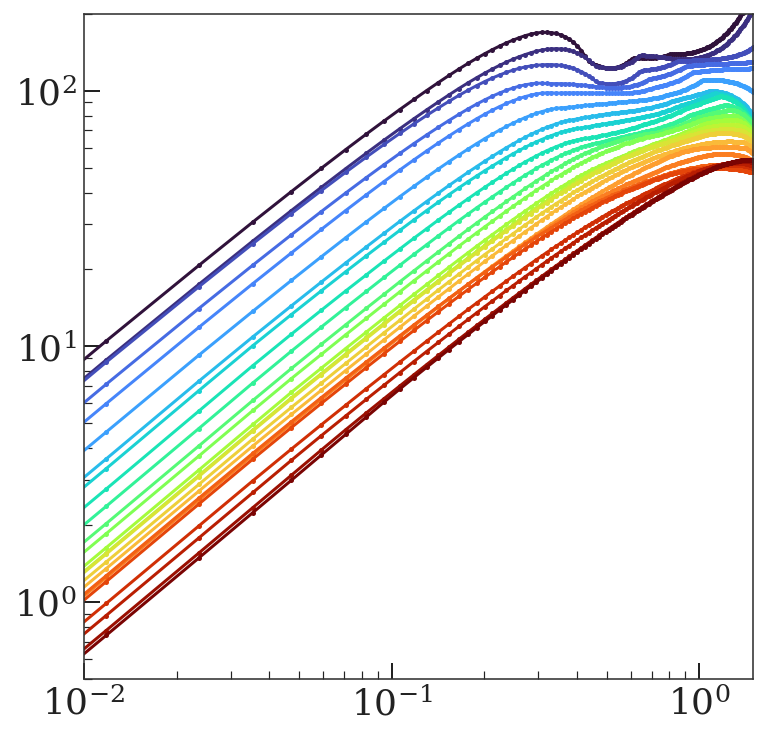

In [117]:
cmap = plt.get_cmap("turbo")
norm = mpl.colors.Normalize(6, 12)

pos_grid = np.linspace(0, 1.5, 128) * u.kpc

Sigz_2d = []
az_2d = []
for res, Rg in zip(reses, Rg_cs):
    az = model.label_model.get_acceleration(pos, res.params)
    az_2d.append(az)

    Sigz = (np.abs(az) / (2 * np.pi * G)).to_value(u.Msun / u.pc**2)
    Sigz_2d.append(Sigz)
    plt.plot(pos.value, Sigz, color=cmap(norm(Rg)))

plt.xscale("log")
plt.yscale("log")
plt.xlim(1e-2, 1.5)
plt.ylim(5e-1, 200)

Sigz_2d = np.array(Sigz_2d)
az_2d = u.Quantity(az_2d)

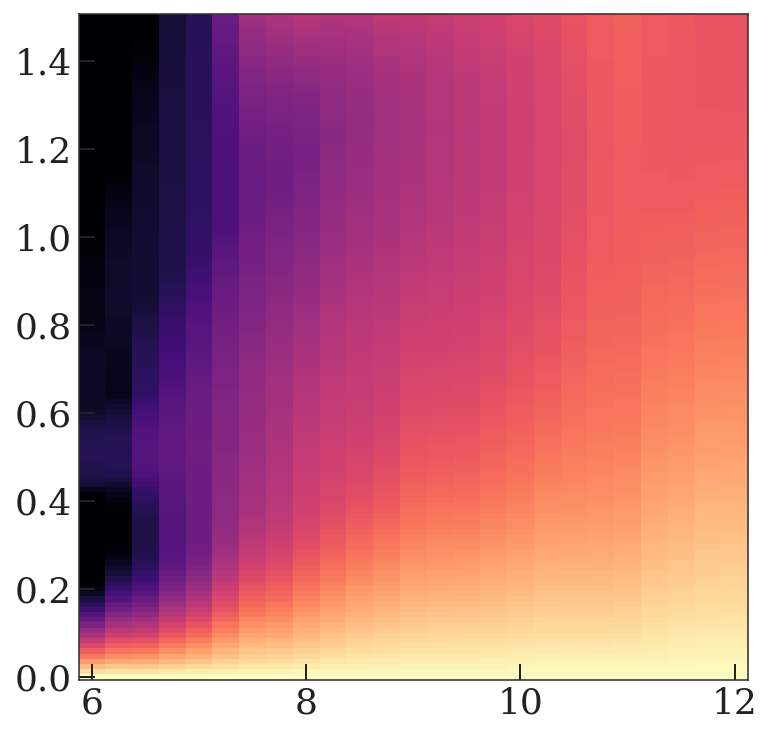

In [122]:
plt.pcolormesh(
    Rg_cs,
    pos_grid.value,
    az_2d.T.to_value(u.km / u.s / u.Myr),
    shading="auto",
    cmap="magma",
    vmin=-4,
    vmax=0,
)